#**Import dataset**

In [135]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

import pandas as pd

# Load the dataset, trying different encodings
try:
    data = pd.read_csv('/content/drive/My Drive/Spotify_Youtube.csv', encoding='latin1')  # Try Latin-1 first
except UnicodeDecodeError:
    data = pd.read_csv('/content/drive/My Drive/Spotify_Youtube.csv', encoding='iso-8859-1')  # Try ISO-8859-1 if Latin-1 fails

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Understanding the Data Structure**

In [136]:
# Check the shape of the dataset
print(f"The dataset has {data.shape[0]} rows and {data.shape[1]} columns.")

# Display the first few rows of the dataset
print(data.head())

# Display the last few rows of the dataset
print(data.tail())

# Get a summary of the dataset
print(data.info())


The dataset has 20718 rows and 28 columns.
   Unnamed: 0    Artist                                        Url_spotify  \
0           0  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...   
1           1  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...   
2           2  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...   
3           3  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...   
4           4  Gorillaz  https://open.spotify.com/artist/3AA28KZvwAUcZu...   

                                           Track  \
0                                 Feel Good Inc.   
1                                Rhinestone Eyes   
2  New Gold (feat. Tame Impala and Bootie Brown)   
3                             On Melancholy Hill   
4                                 Clint Eastwood   

                                           Album Album_type  \
0                                     Demon Days      album   
1                                  Plastic Beach 

# **Summary Statistics**
**What is the distribution of numerical columns?**

In [137]:
# Summary statistics for numerical columns
print(data.describe())


         Unnamed: 0  Danceability        Energy           Key      Loudness  \
count  20718.000000  20716.000000  20716.000000  20716.000000  20716.000000   
mean   10358.500000      0.619777      0.635250      5.300348     -7.671680   
std     5980.915774      0.165272      0.214147      3.576449      4.632749   
min        0.000000      0.000000      0.000020      0.000000    -46.251000   
25%     5179.250000      0.518000      0.507000      2.000000     -8.858000   
50%    10358.500000      0.637000      0.666000      5.000000     -6.536000   
75%    15537.750000      0.740250      0.798000      8.000000     -4.931000   
max    20717.000000      0.975000      1.000000     11.000000      0.920000   

        Speechiness  Acousticness  Instrumentalness      Liveness  \
count  20716.000000  20716.000000      20716.000000  20716.000000   
mean       0.096456      0.291535          0.055962      0.193521   
std        0.111960      0.286299          0.193262      0.168531   
min        0

# **Checking for Missing Values**

Unnamed: 0            0
Artist                0
Url_spotify           0
Track                 0
Album                 0
Album_type            0
Uri                   0
Danceability          2
Energy                2
Key                   2
Loudness              2
Speechiness           2
Acousticness          2
Instrumentalness      2
Liveness              2
Valence               2
Tempo                 2
Duration_ms           2
Url_youtube         470
Title               470
Channel             470
Views               470
Likes               541
Comments            569
Description         876
Licensed            470
official_video      470
Stream              576
dtype: int64


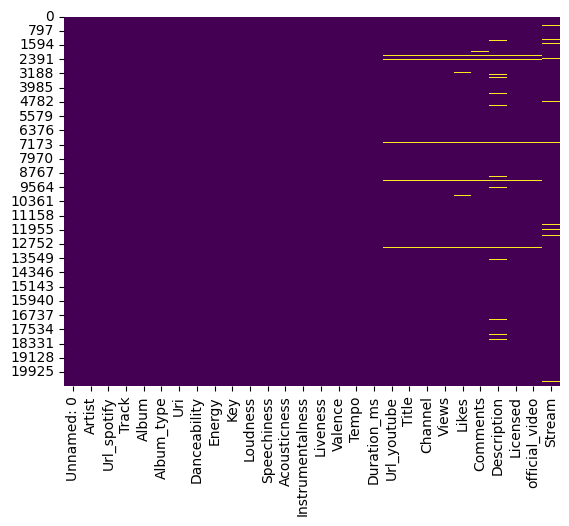

In [138]:
# Check for missing values
print(data.isnull().sum())

# If there are missing values, you might want to visualize them
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.show()


Unnamed: 0            0
Artist                0
Url_spotify           0
Track                 0
Album                 0
Album_type            0
Uri                   0
Danceability          2
Energy                2
Key                   2
Loudness              2
Speechiness           2
Acousticness          2
Instrumentalness      2
Liveness              2
Valence               2
Tempo                 2
Duration_ms           2
Url_youtube         470
Title               470
Channel             470
Views               470
Likes               541
Comments            569
Description         876
Licensed            470
official_video      470
Stream              576
dtype: int64


<Axes: >

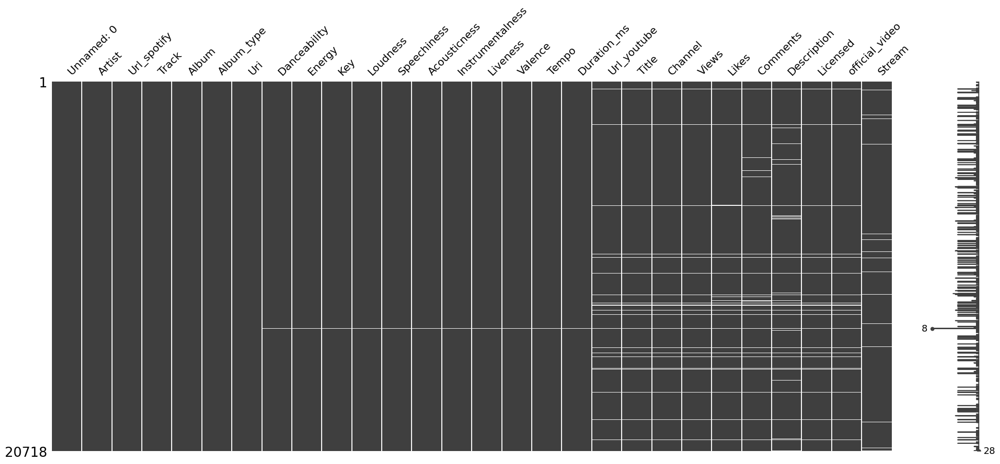

In [139]:
# Check for missing values
print(data.isnull().sum())

# Visualize missing values (requires missingno library)
import missingno as msno
msno.matrix(data)


In [140]:
# Fill missing values
data.fillna(method='ffill', inplace=True)  # Forward fill
data.fillna(method='bfill', inplace=True)  # Backward fill

# Drop rows with missing values
data.dropna(inplace=True)


<ipython-input-140-8a85c36357f9>:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='ffill', inplace=True)  # Forward fill
<ipython-input-140-8a85c36357f9>:3: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data.fillna(method='bfill', inplace=True)  # Backward fill


In [141]:
print(data.isnull().sum().sum())

0


# **Understanding the Distribution of Data**

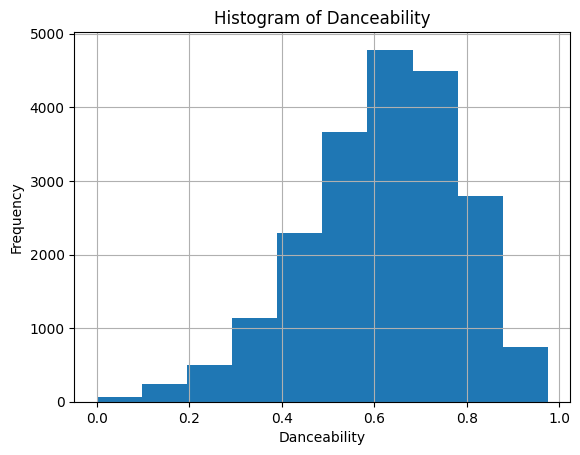

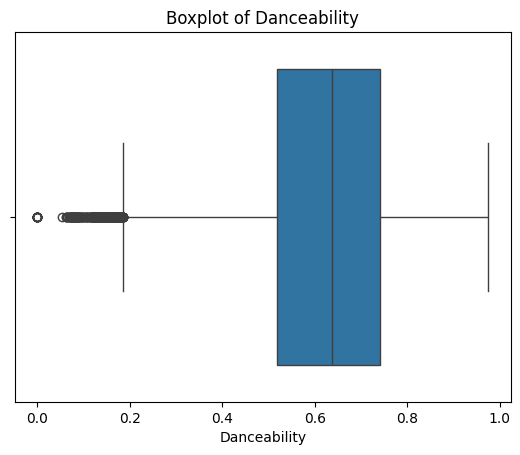

In [142]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram for a numerical column
data['Danceability'].hist()
plt.title('Histogram of Danceability')
plt.xlabel('Danceability')
plt.ylabel('Frequency')
plt.show()

# Boxplot for a numerical column
sns.boxplot(x=data['Danceability'])
plt.title('Boxplot of Danceability')
plt.show()


In [143]:
# Identify categorical columns
categorical_columns = data.select_dtypes(include=['object', 'category']).columns
print("Categorical columns:", categorical_columns)

Categorical columns: Index(['Artist', 'Url_spotify', 'Track', 'Album', 'Album_type', 'Uri',
       'Url_youtube', 'Title', 'Channel', 'Description'],
      dtype='object')


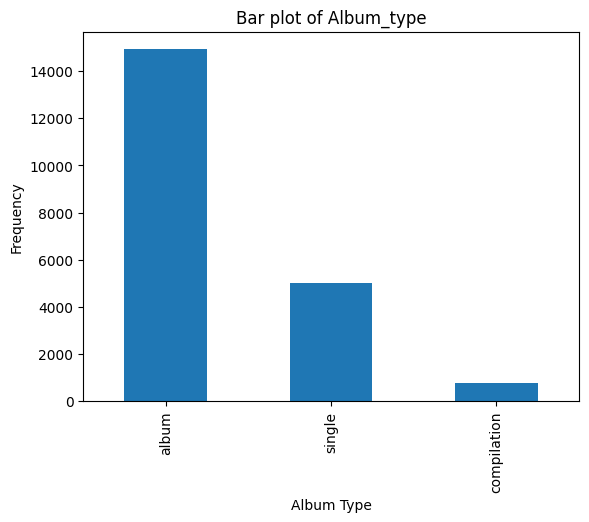

In [144]:
# Bar plot for categorical data
data['Album_type'].value_counts().plot(kind='bar')
plt.title('Bar plot of Album_type')
plt.xlabel('Album Type')
plt.ylabel('Frequency')
plt.show()


# **Bivariate Analysis**
**How do categorical variables relate to numerical variables?**

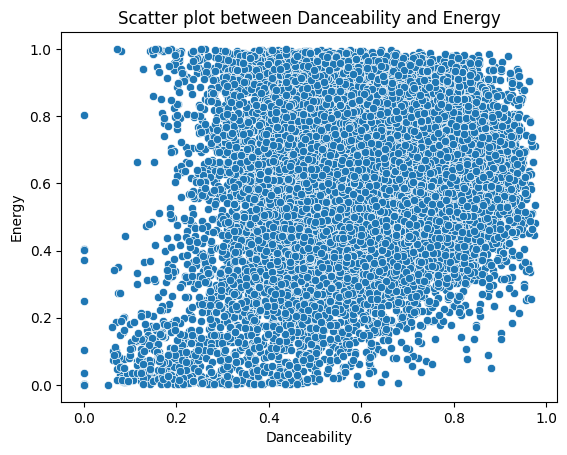

In [145]:
# Scatter plot
sns.scatterplot(x='Danceability', y='Energy', data=data)
plt.title('Scatter plot between Danceability and Energy')
plt.xlabel('Danceability')
plt.ylabel('Energy')
plt.show()

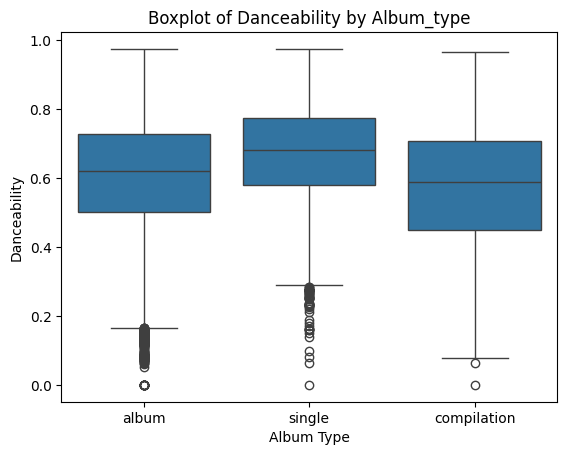

In [146]:
# Boxplot
sns.boxplot(x='Album_type', y='Danceability', data=data)
plt.title('Boxplot of Danceability by Album_type')
plt.xlabel('Album Type')
plt.ylabel('Danceability')
plt.show()


# **Correlation Matrix**
**Are there any correlations between numerical variables?**

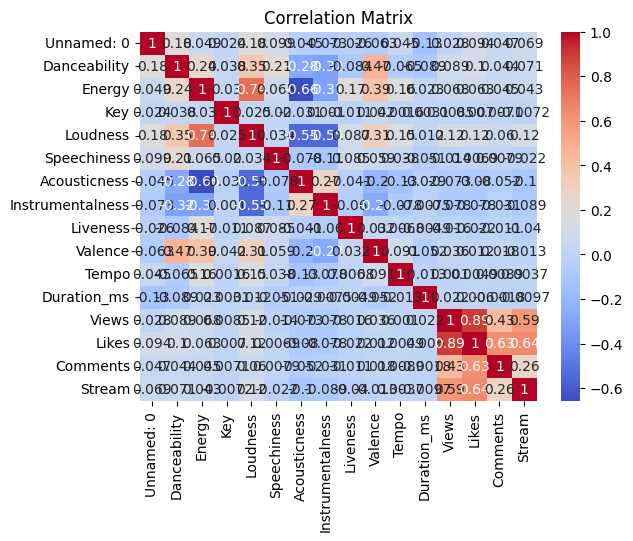

In [147]:
import seaborn as sns
import pandas as pd

# Select only numeric columns for correlation
numeric_data = data.select_dtypes(include=['number'])

correlation_matrix = numeric_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# **What are the relationships between different categorical variables?**

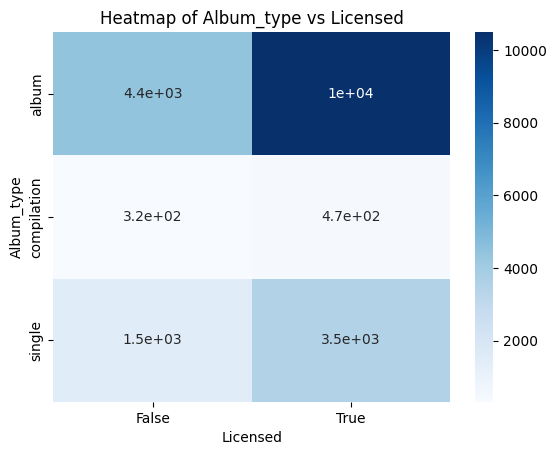

In [148]:
# Cross-tabulation and heatmap
cross_tab = pd.crosstab(data['Album_type'], data['Licensed'])
sns.heatmap(cross_tab, annot=True, cmap='Blues')
plt.title('Heatmap of Album_type vs Licensed')
plt.show()

# **What are the unique values in each categorical column?**

In [156]:
for col in categorical_columns:
    print(f"Unique values in {col}:")
    print(data[col].unique())

Unique values in Artist:
['Gorillaz' 'Red Hot Chili Peppers' '50 Cent' ... 'LE SSERAFIM' 'ThxSoMch'
 'SICK LEGEND']
Unique values in Url_spotify:
['https://open.spotify.com/artist/3AA28KZvwAUcZuOKwyblJQ'
 'https://open.spotify.com/artist/0L8ExT028jH3ddEcZwqJJ5'
 'https://open.spotify.com/artist/3q7HBObVc0L8jNeTe5Gofh' ...
 'https://open.spotify.com/artist/4SpbR6yFEvexJuaBpgAU5p'
 'https://open.spotify.com/artist/4MvZhE1iuzttcoyepkpfdF'
 'https://open.spotify.com/artist/3EYY5FwDkHEYLw5V86SAtl']
Unique values in Track:
['Feel Good Inc.' 'Rhinestone Eyes'
 'New Gold (feat. Tame Impala and Bootie Brown)' ...
 'OUTSIDE HARDSTYLE SPED UP' 'ONLY GIRL HARDSTYLE' 'MISS YOU HARDSTYLE']
Unique values in Album:
['Demon Days' 'Plastic Beach'
 'New Gold (feat. Tame Impala and Bootie Brown)' ...
 'OUTSIDE HARDSTYLE SPED UP' 'ONLY GIRL HARDSTYLE' 'MISS YOU HARDSTYLE']
Unique values in Album_type:
['album' 'single' 'compilation']
Unique values in Uri:
['spotify:track:0d28khcov6AiegSCpG5TuT'
 'spotify:t

# **Feature Engineering**

In [149]:
from sklearn.preprocessing import StandardScaler

# Normalize a numerical column
scaler = StandardScaler()
data['Danceability_normalized'] = scaler.fit_transform(data[['Danceability']])


# **Outlier Detection**
**Are there outliers in the dataset?**

In [150]:
from scipy import stats

# Z-score method for outlier detection
z_scores = stats.zscore(data[['Danceability']])
data['Danceability_outlier'] = (z_scores > 3) | (z_scores < -3)

# Filter out outliers
outliers = data[data['Danceability_outlier']]
print(outliers)


       Unnamed: 0                     Artist  \
593           593                Hans Zimmer   
919           919      Johann Sebastian Bach   
1332         1332    Wolfgang Amadeus Mozart   
1722         1722  London Symphony Orchestra   
1723         1723  London Symphony Orchestra   
...           ...                        ...   
15593       15593     White Noise Baby Sleep   
15594       15594     White Noise Baby Sleep   
15595       15595     White Noise Baby Sleep   
15597       15597     White Noise Baby Sleep   
20586       20586         Rain Fruits Sounds   

                                             Url_spotify  \
593    https://open.spotify.com/artist/0YC192cP3KPCRW...   
919    https://open.spotify.com/artist/5aIqB5nVVvmFsv...   
1332   https://open.spotify.com/artist/4NJhFmfw43RLBL...   
1722   https://open.spotify.com/artist/5yxyJsFanEAuwS...   
1723   https://open.spotify.com/artist/5yxyJsFanEAuwS...   
...                                                  ...   
155

In [151]:
# Cap outliers
data['Danceability'] = data['Danceability'].clip(lower=data['Danceability'].quantile(0.05), upper=data['Danceability'].quantile(0.95))


# **Visualization**
**How can we visualize the data more effectively?**



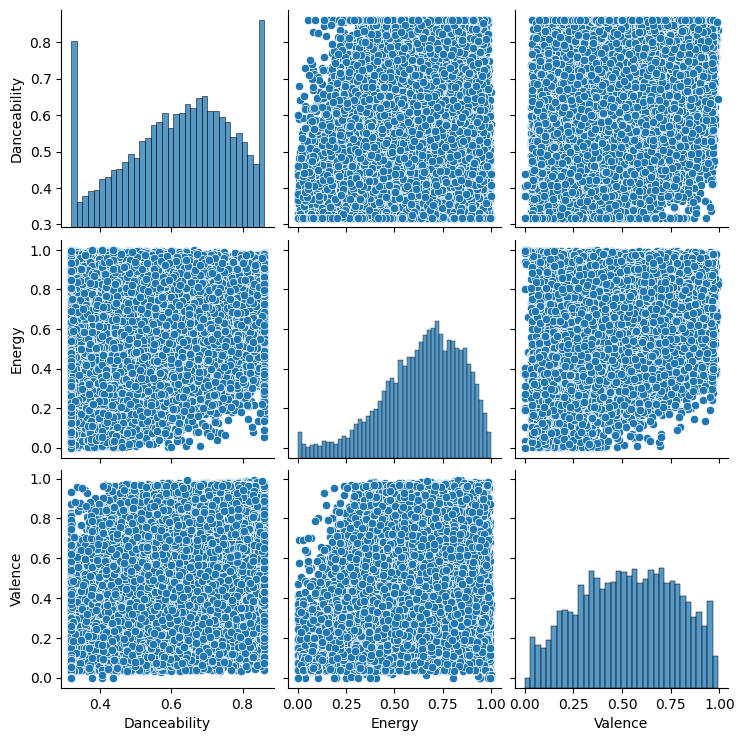

In [152]:
# Pair plot for numerical columns
sns.pairplot(data[['Danceability', 'Energy', 'Valence']])
plt.show()

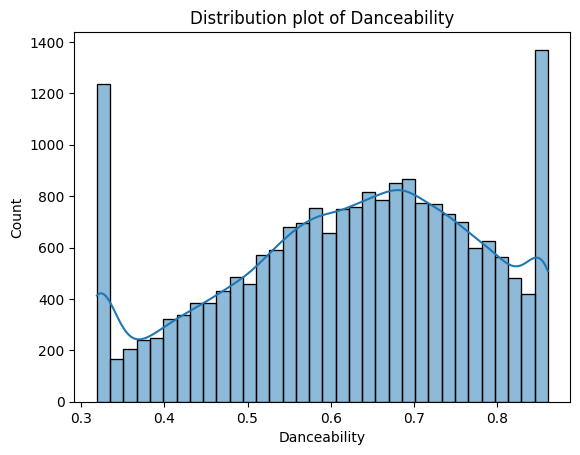

In [153]:
# Distribution plot
sns.histplot(data['Danceability'], kde=True)
plt.title('Distribution plot of Danceability')
plt.show()

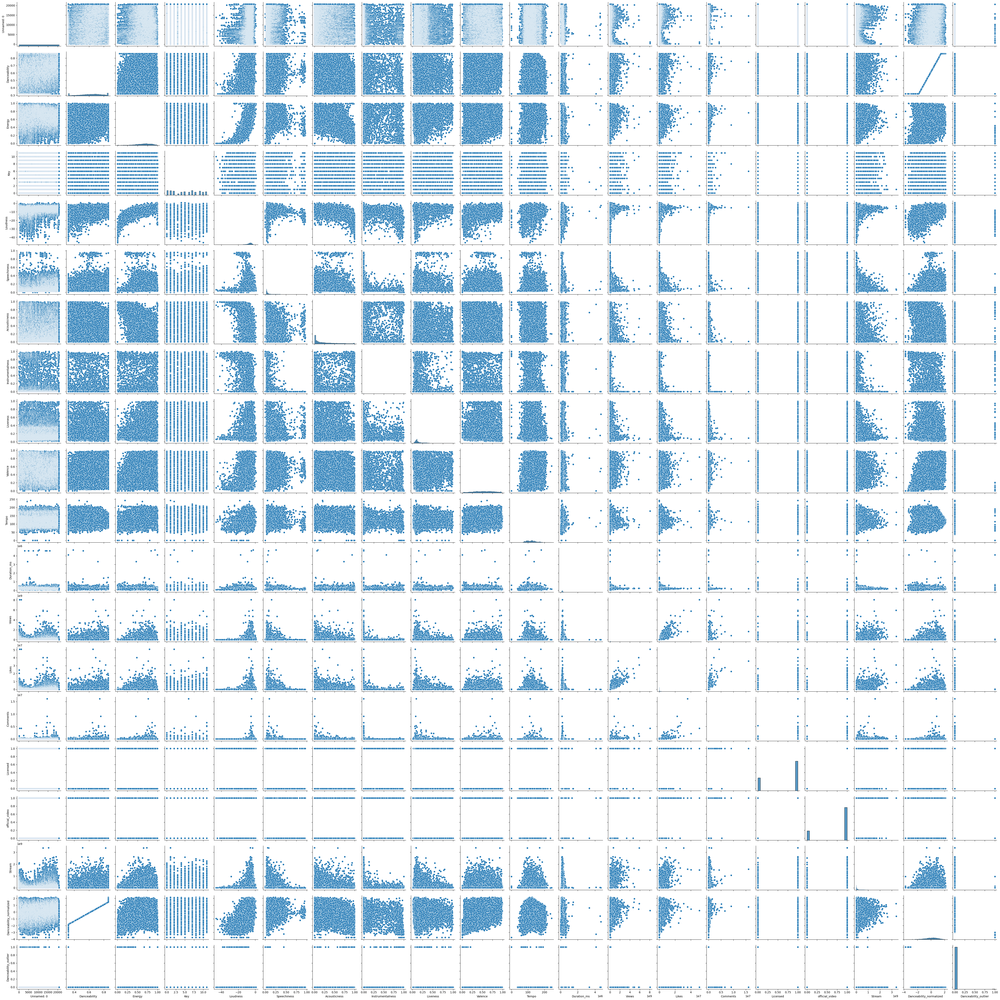

In [154]:
# Pairplot
sns.pairplot(data)
plt.show()
